In [6]:
!pip install shap
import shap
!pip install lime
import lime
import lime.lime_tabular

import pandas as pd
import numpy as np
import random
import seaborn as sns
from matplotlib import pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import PowerTransformer
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

from sklearn.metrics import roc_auc_score, make_scorer, accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import plot_confusion_matrix

import xgboost as xgb
from xgboost import plot_importance


from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import plot_confusion_matrix
from sklearn import linear_model

from sklearn.svm import SVC

import warnings
warnings.simplefilter(action ='ignore')

In [28]:
heloc = pd.read_csv("heloc.csv")
print(heloc.shape)
heloc.head()


(10459, 24)


,RiskPerformance,ExternalRiskEstimate,MSinceOldestTradeOpen,MSinceMostRecentTradeOpen,AverageMInFile,NumSatisfactoryTrades,NumTrades60Ever2DerogPubRec,NumTrades90Ever2DerogPubRec,PercentTradesNeverDelq,MSinceMostRecentDelq,...,PercentInstallTrades,MSinceMostRecentInqexcl7days,NumInqLast6M,NumInqLast6Mexcl7days,NetFractionRevolvingBurden,NetFractionInstallBurden,NumRevolvingTradesWBalance,NumInstallTradesWBalance,NumBank2NatlTradesWHighUtilization,PercentTradesWBalance
0,Bad,55,144,4,84,20,3,0,83,2,...,43,0,0,0,33,-8,8,1,1,69
1,Bad,61,58,15,41,2,4,4,100,-7,...,67,0,0,0,0,-8,0,-8,-8,0
2,Bad,67,66,5,24,9,0,0,100,-7,...,44,0,4,4,53,66,4,2,1,86
3,Bad,66,169,1,73,28,1,1,93,76,...,57,0,5,4,72,83,6,4,3,91
4,Bad,81,333,27,132,12,0,0,100,-7,...,25,0,1,1,51,89,3,1,0,80


# **Label Encoding**

"Bad":1  
"Good":0

In [29]:
df= heloc.copy()
df.replace({"Bad":1, "Good":0}, inplace=True)
df.head()

,RiskPerformance,ExternalRiskEstimate,MSinceOldestTradeOpen,MSinceMostRecentTradeOpen,AverageMInFile,NumSatisfactoryTrades,NumTrades60Ever2DerogPubRec,NumTrades90Ever2DerogPubRec,PercentTradesNeverDelq,MSinceMostRecentDelq,...,PercentInstallTrades,MSinceMostRecentInqexcl7days,NumInqLast6M,NumInqLast6Mexcl7days,NetFractionRevolvingBurden,NetFractionInstallBurden,NumRevolvingTradesWBalance,NumInstallTradesWBalance,NumBank2NatlTradesWHighUtilization,PercentTradesWBalance
0,1,55,144,4,84,20,3,0,83,2,...,43,0,0,0,33,-8,8,1,1,69
1,1,61,58,15,41,2,4,4,100,-7,...,67,0,0,0,0,-8,0,-8,-8,0
2,1,67,66,5,24,9,0,0,100,-7,...,44,0,4,4,53,66,4,2,1,86
3,1,66,169,1,73,28,1,1,93,76,...,57,0,5,4,72,83,6,4,3,91
4,1,81,333,27,132,12,0,0,100,-7,...,25,0,1,1,51,89,3,1,0,80


In [30]:
#df.info()

# **Separating predictor features**

In [31]:
# take the label away
predictor = heloc.iloc[:, 1:].copy()
#predictor.info()

In [32]:
print("SPECIAL VALUES: ")
for i in range(23):
    print(i+1, ".", predictor.iloc[:, i].name, end=': ')
    for x in predictor.iloc[:, i].unique():
        if x < 0:
            print(x, end=', ')
    print()

SPECIAL VALUES: 
1 . ExternalRiskEstimate: -9, 
2 . MSinceOldestTradeOpen: -9, -8, 
3 . MSinceMostRecentTradeOpen: -9, 
4 . AverageMInFile: -9, 
5 . NumSatisfactoryTrades: -9, 
6 . NumTrades60Ever2DerogPubRec: -9, 
7 . NumTrades90Ever2DerogPubRec: -9, 
8 . PercentTradesNeverDelq: -9, 
9 . MSinceMostRecentDelq: -7, -8, -9, 
10 . MaxDelq2PublicRecLast12M: -9, 
11 . MaxDelqEver: -9, 
12 . NumTotalTrades: -9, 
13 . NumTradesOpeninLast12M: -9, 
14 . PercentInstallTrades: -9, 
15 . MSinceMostRecentInqexcl7days: -9, -7, -8, 
16 . NumInqLast6M: -9, 
17 . NumInqLast6Mexcl7days: -9, 
18 . NetFractionRevolvingBurden: -8, -9, 
19 . NetFractionInstallBurden: -8, -9, 
20 . NumRevolvingTradesWBalance: -8, -9, 
21 . NumInstallTradesWBalance: -8, -9, 
22 . NumBank2NatlTradesWHighUtilization: -8, -9, 
23 . PercentTradesWBalance: -9, -8, 


-> All predictor columns have special values

In [33]:
for i in range(23):
  print(predictor.iloc[:, i].name, end=': ')
  print(predictor.iloc[:, i].unique())
  print()

ExternalRiskEstimate: [55 61 67 66 81 59 54 68 82 50 74 69 63 62 89 65 57 72 64 58 79 71 75 88
 51 70 78 86 90 76 73 83 87 -9 91 84 60 77 56 92 49 80 85 93 52 45 94 47
 43 48 40 39 44 36 37 53 34 46 33 42 41]

MSinceOldestTradeOpen: [144  58  66 169 333 137  88 148 324  79  96 311 274 256 262 184 131 244
  43 147 365  84  91 265 150 162 284 476 179 114 133 164 118 153 186 127
 116  21 318 230 293  37 255 209 398 326 478 197 243 183 176 368  -9 300
 168 277 174 126 409 419 282 134 155  70 294 357 106  85 204 151 307  17
 188 107 378 299  76 211 220 177 112 224 152 120 246 123 212 208 203 160
 103 159 241  61 178 198 258  41  14 233 252  -8 154  97 136 190 221 242
 132 245  27 139 222 218 156  82 247 129  93 321 338 195 145 352 205 135
 433 175 344 140 502 334 182 267 340 439 295 286 111 399  90  99 415 288
 163 281 407 191 180  69 363 253 170 325 474 234 432 130 251 280 125 408
 271 306 232 336 264 254 165 273 161 250 173  81 290 279 196  77  94  74
 219 369 266 375 291 122  72 269 343 

Value	Meaning

-9	: No Bureau Record or No Investigation

-8 :	No Usable/Valid Trades or Inquiries

-7: 	Condition not Met (e.g. No Inquiries, No Delinquencies)




In [34]:
# get the index of special values
indices = []
for i in range(df.shape[0]):
  conditon = predictor.iloc[i, :] <0
  if conditon.any():
    indices.append(i)
# there 7957 rows have missing values which is a lot -> should not delete them
len(indices)

7957

**Due with Special Values**

In [35]:
# replace special valuess to nan
df.replace({-7:np.NaN, -8:np.NaN, -9:np.NaN}, inplace=True)

In [36]:
# replace nan to mean
for i in range(1,24,1):
  df.iloc[:, i] = df.iloc[:, i].fillna(df.iloc[:, i].mean())


IMPORTANCE FEATURES:
1. ExternalRiskEstimate
2.  NumTrades60Ever2DerogPubRec
3. PercentInstallTrades
4. NetFractionInstallBurden
5. NumRevolvingTradesWBalance
6. NumInstallTradesWBalance
7. PercentTradesWBalance

In [37]:
correlation_coefficient = df.iloc[:, 1:].corr().round(1)
correlation_coefficient

,ExternalRiskEstimate,MSinceOldestTradeOpen,MSinceMostRecentTradeOpen,AverageMInFile,NumSatisfactoryTrades,NumTrades60Ever2DerogPubRec,NumTrades90Ever2DerogPubRec,PercentTradesNeverDelq,MSinceMostRecentDelq,MaxDelq2PublicRecLast12M,...,PercentInstallTrades,MSinceMostRecentInqexcl7days,NumInqLast6M,NumInqLast6Mexcl7days,NetFractionRevolvingBurden,NetFractionInstallBurden,NumRevolvingTradesWBalance,NumInstallTradesWBalance,NumBank2NatlTradesWHighUtilization,PercentTradesWBalance
ExternalRiskEstimate,1.0,0.2,0.1,0.3,0.0,-0.4,-0.3,0.5,0.3,0.6,...,-0.2,0.2,-0.2,-0.2,-0.6,-0.1,-0.3,-0.2,-0.5,-0.5
MSinceOldestTradeOpen,0.2,1.0,0.1,0.7,0.2,-0.0,-0.0,0.0,0.0,-0.0,...,-0.2,0.1,-0.1,-0.1,-0.2,-0.1,0.1,-0.0,-0.0,-0.2
MSinceMostRecentTradeOpen,0.1,0.1,1.0,0.4,-0.3,0.0,0.0,-0.1,-0.0,0.0,...,-0.0,0.1,-0.2,-0.2,-0.1,-0.1,-0.2,-0.1,-0.1,-0.0
AverageMInFile,0.3,0.7,0.4,1.0,0.1,0.0,0.0,-0.0,0.0,-0.0,...,-0.2,0.1,-0.2,-0.2,-0.2,-0.1,0.0,-0.1,-0.0,-0.2
NumSatisfactoryTrades,0.0,0.2,-0.3,0.1,1.0,-0.1,-0.1,0.3,0.0,-0.0,...,-0.1,0.0,0.1,0.1,-0.1,-0.0,0.5,0.3,0.2,-0.2
NumTrades60Ever2DerogPubRec,-0.4,-0.0,0.0,0.0,-0.1,1.0,0.9,-0.5,-0.0,-0.4,...,0.1,-0.1,0.0,0.0,0.1,-0.0,-0.0,0.0,-0.0,0.1
NumTrades90Ever2DerogPubRec,-0.3,-0.0,0.0,0.0,-0.1,0.9,1.0,-0.4,0.0,-0.4,...,0.1,-0.1,0.0,0.0,0.1,0.0,-0.1,0.0,-0.0,0.1
PercentTradesNeverDelq,0.5,0.0,-0.1,-0.0,0.3,-0.5,-0.4,1.0,0.2,0.5,...,-0.1,0.1,0.0,0.0,-0.2,0.0,0.1,0.0,-0.0,-0.2
MSinceMostRecentDelq,0.3,0.0,-0.0,0.0,0.0,-0.0,0.0,0.2,1.0,0.4,...,-0.0,0.0,-0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0
MaxDelq2PublicRecLast12M,0.6,-0.0,0.0,-0.0,-0.0,-0.4,-0.4,0.5,0.4,1.0,...,-0.1,0.1,-0.0,-0.0,-0.1,0.0,-0.1,-0.1,-0.1,-0.1


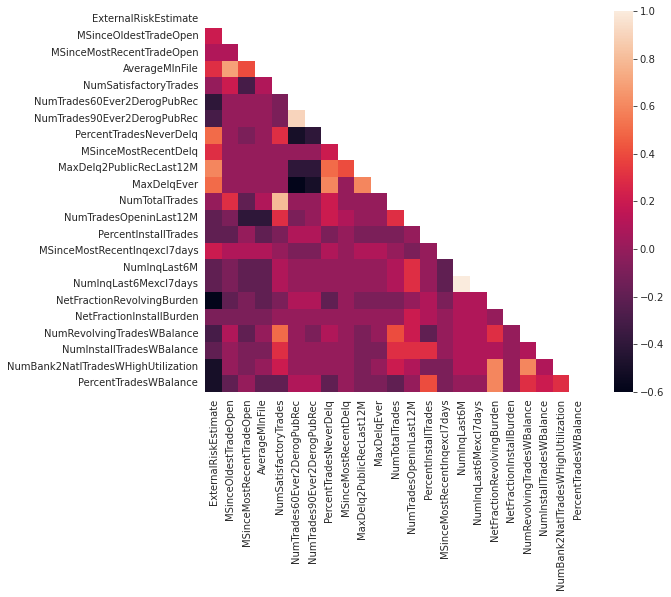

In [38]:
mask = np.zeros_like(correlation_coefficient)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(10, 7))
    ax = sns.heatmap(correlation_coefficient, mask=mask, vmax=1, square=True)


# Train model

In [39]:
X = df.drop('RiskPerformance', axis=1)
y = df['RiskPerformance']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.33, random_state=8)

In [40]:
X_test, X_dummy, y_test, y_dummy = train_test_split(X_test, y_test, test_size=0.002, random_state=8)
X_dummy

,ExternalRiskEstimate,MSinceOldestTradeOpen,MSinceMostRecentTradeOpen,AverageMInFile,NumSatisfactoryTrades,NumTrades60Ever2DerogPubRec,NumTrades90Ever2DerogPubRec,PercentTradesNeverDelq,MSinceMostRecentDelq,MaxDelq2PublicRecLast12M,...,PercentInstallTrades,MSinceMostRecentInqexcl7days,NumInqLast6M,NumInqLast6Mexcl7days,NetFractionRevolvingBurden,NetFractionInstallBurden,NumRevolvingTradesWBalance,NumInstallTradesWBalance,NumBank2NatlTradesWHighUtilization,PercentTradesWBalance
9,61.0,79.0,4.0,36.0,19.0,0.0,0.0,95.0,5.000000,4.0,...,26.0,0.0,6.0,6.0,31.0,86.000000,5.0,3.0,1.0,62.0
4359,82.0,125.0,16.0,63.0,9.0,0.0,0.0,100.0,21.879547,7.0,...,33.0,0.0,1.0,0.0,28.0,68.537973,1.0,1.0,0.0,40.0
8166,84.0,403.0,14.0,157.0,26.0,0.0,0.0,100.0,21.879547,7.0,...,7.0,13.0,0.0,0.0,3.0,68.537973,11.0,1.0,1.0,75.0
9611,85.0,208.0,2.0,73.0,11.0,0.0,0.0,100.0,21.879547,7.0,...,38.0,1.0,2.0,2.0,19.0,68.537973,2.0,2.0,1.0,80.0
1492,63.0,140.0,13.0,76.0,22.0,0.0,0.0,95.0,22.000000,6.0,...,23.0,0.0,3.0,3.0,91.0,68.537973,2.0,1.0,2.0,60.0
7957,73.0,422.0,2.0,62.0,42.0,0.0,0.0,98.0,11.000000,4.0,...,23.0,0.0,4.0,4.0,12.0,68.537973,4.0,2.0,0.0,44.0
8384,72.0,252.0,1.0,80.0,48.0,0.0,0.0,100.0,21.879547,7.0,...,20.0,0.0,3.0,3.0,17.0,88.000000,5.0,3.0,1.0,44.0


## **Neural Network**  
Give 70% accuracy but Can't get the shap to work on this model

In [ ]:
#X = df.drop('RiskPerformance', axis=1).to_numpy()
#Y = df['RiskPerformance'].to_numpy()

#X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.33, random_state=42)

#neural_net = make_pipeline(
    #StandardScaler(),
    #MLPClassifier(hidden_layer_sizes=(3,),activation='relu',solver='adam',  max_iter=10000,learning_rate='constant',random_state=0, early_stopping=True)   
#)

#neural_net.fit(X_train, y_train)

#neural_net.predict_proba(X_test[0:])

#neural_net.score(X_test, y_test)

#explainer = shap.KernelExplainer(neural_net.predict,X_train)

#shap_values = explainer.shap_values(X_test,nsamples=100)

#shap.summary_plot(shap_values,X_test,feature_names=features)

## **XGBOOST**

Divide data into 3 subsets  
Train  
Test  
Dummy (for frontend experiment)

In [89]:
X = df.drop('RiskPerformance', axis=1)
y = df['RiskPerformance']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.33, random_state=8)


X_test, X_dummy, y_test, y_dummy = train_test_split(X_test, y_test, test_size=0.002, random_state=8)


In [90]:
X_dummy

,ExternalRiskEstimate,MSinceOldestTradeOpen,MSinceMostRecentTradeOpen,AverageMInFile,NumSatisfactoryTrades,NumTrades60Ever2DerogPubRec,NumTrades90Ever2DerogPubRec,PercentTradesNeverDelq,MSinceMostRecentDelq,MaxDelq2PublicRecLast12M,...,PercentInstallTrades,MSinceMostRecentInqexcl7days,NumInqLast6M,NumInqLast6Mexcl7days,NetFractionRevolvingBurden,NetFractionInstallBurden,NumRevolvingTradesWBalance,NumInstallTradesWBalance,NumBank2NatlTradesWHighUtilization,PercentTradesWBalance
9,61.0,79.0,4.0,36.0,19.0,0.0,0.0,95.0,5.000000,4.0,...,26.0,0.0,6.0,6.0,31.0,86.000000,5.0,3.0,1.0,62.0
4359,82.0,125.0,16.0,63.0,9.0,0.0,0.0,100.0,21.879547,7.0,...,33.0,0.0,1.0,0.0,28.0,68.537973,1.0,1.0,0.0,40.0
8166,84.0,403.0,14.0,157.0,26.0,0.0,0.0,100.0,21.879547,7.0,...,7.0,13.0,0.0,0.0,3.0,68.537973,11.0,1.0,1.0,75.0
9611,85.0,208.0,2.0,73.0,11.0,0.0,0.0,100.0,21.879547,7.0,...,38.0,1.0,2.0,2.0,19.0,68.537973,2.0,2.0,1.0,80.0
1492,63.0,140.0,13.0,76.0,22.0,0.0,0.0,95.0,22.000000,6.0,...,23.0,0.0,3.0,3.0,91.0,68.537973,2.0,1.0,2.0,60.0
7957,73.0,422.0,2.0,62.0,42.0,0.0,0.0,98.0,11.000000,4.0,...,23.0,0.0,4.0,4.0,12.0,68.537973,4.0,2.0,0.0,44.0
8384,72.0,252.0,1.0,80.0,48.0,0.0,0.0,100.0,21.879547,7.0,...,20.0,0.0,3.0,3.0,17.0,88.000000,5.0,3.0,1.0,44.0


**Build model**

[13:14:45] WARNING: C:/Users/administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "col_sample_bytree" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




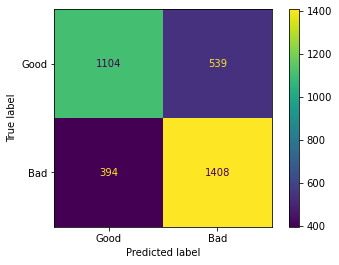

In [91]:
xgb_model = xgb.XGBClassifier(objective="reg:logistic", 
                              seed=70, 
                              col_sample_bytree=0.4,
                              learning_rate= 0.01, 
                              max_depth= 5,
                              n_estimators=500,
                              alpha=10)

xgb_model.fit(X_train.values, y_train)
plot_confusion_matrix(xgb_model,X_test.values,  y_test, values_format='d', display_labels =["Good", "Bad"]  )

In [92]:
xgb_pred = xgb_model.predict(X_test.values)
print('Training accuracy:', accuracy_score(y_train, xgb_model.predict(X_train.values)))
print('Test accuracy:', accuracy_score(y_test, xgb_pred))

Training accuracy: 0.7493934636791779
Test accuracy: 0.7291727140783745


In [93]:
print('ROC_AUC: ', roc_auc_score(y_test, xgb_pred))

ROC_AUC:  0.7266478106763096


In [94]:
print(classification_report(y_test, xgb_pred, target_names=["Good", "Bad"]))

              precision    recall  f1-score   support

        Good       0.74      0.67      0.70      1643
         Bad       0.72      0.78      0.75      1802

    accuracy                           0.73      3445
   macro avg       0.73      0.73      0.73      3445
weighted avg       0.73      0.73      0.73      3445



<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

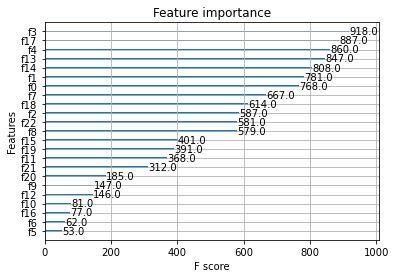

In [95]:
# feature importance
plot_importance(xgb_model, )


Create a test dataframe which consists of actual label and predicted label

In [96]:
test = y_test.to_frame()
test['predict'] = xgb_pred
test.rename(columns={"RiskPerformance":"actual"}, inplace=True)
test.sample(5)

,actual,predict
3802,0,0
6293,0,0
8638,0,0
2258,1,1
3900,1,1


## **LIME**
**LOCAL EXPLAINATION**

---



---



In [97]:
# For example, LIME explain the prediction on 1st observation of dummy 
X_observation = X_dummy.iloc[0]        # This is for front-end to change the observation 
explanation = explainer.explain_instance(X_observation.values, xgb_model.predict_proba)
explanation.show_in_notebook()

Intercept 0.21438835260450778
Prediction_local [0.90069491]
Right: 0.90090525


In [ ]:
# 
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, 
                                                   feature_names=predictor.columns, 
                                                   verbose=True, 
                                                   class_names=['Good', 'Bad'],
                                                   mode='classification')
                                           

Separating good and bad observations from test set

In [ ]:
bad = test[test['predict']== 1].index
good = test[test['predict']== 0].index


***Visualizing Bad observations*** based on prediction




Observation 1:

In [ ]:
bad_index =np.random.choice(bad)
print(y_test.loc[bad_index])
X_test.loc[bad_index]

In [ ]:
print('Predict:',test.loc[bad_index, "predict"])
#xgb_model.predict(X_test.loc[bad_index])[0]
print("Actual:" , test.loc[bad_index, 'actual'])

exp = explainer.explain_instance(X_test.loc[bad_index],  xgb_model.predict_proba, num_features=23)
exp.show_in_notebook(show_table=True)

Observation 2:
Wrong Prediction

In [ ]:
wrong_predit = []
for i in test.index:
  if test.loc[i, 'predict'] == 1 :
    if test.loc[i, 'actual'] == 0:
      wrong_predit.append(i)

wrong_predit[3:10]

In [ ]:
bad_index =np.random.choice(wrong_predit)
print('Predict:',test.loc[bad_index, "predict"])
print("Actual:" , test.loc[bad_index, 'actual'])
exp = explainer.explain_instance(X_test.loc[bad_index ],  xgb_model.predict_proba, num_features=23)
exp.show_in_notebook(show_table=True)

Observation 3:

In [ ]:
bad_index =np.random.choice(bad)
print('Predict:',test.loc[bad_index, "predict"])
print("Actual:" , test.loc[bad_index, 'actual'])

exp = explainer.explain_instance(X_test.loc[bad_index],  xgb_model.predict_proba, num_features=23)
exp.show_in_notebook(show_table=True)

***Visualising Good Observations***

Observation 1:

In [ ]:
good_index =np.random.choice(good)
print(y_test.loc[good_index])
X_test.loc[good_index]

In [ ]:
good_index =np.random.choice(good)
print('Predict:',test.loc[good_index, "predict"])
print("Actual:" , test.loc[good_index, 'actual'])
exp = explainer.explain_instance(X_test.loc[good_index],  xgb_model.predict_proba, num_features=23)
exp.show_in_notebook(show_table=True)

Observation 2:

In [ ]:
good_index =np.random.choice(good)
print('Predict:',test.loc[good_index, "predict"])
print("Actual:" , test.loc[good_index, 'actual'])
exp = explainer.explain_instance(X_test.loc[good_index],  xgb_model.predict_proba, num_features=23)
exp.show_in_notebook(show_table=True)

Observation 3: Wrong Prediction

In [ ]:
wrong_predit = []
for i in test.index:
  if test.loc[i, 'predict'] == 0 :
    if test.loc[i, 'actual'] == 1:
      wrong_predit.append(i)

good_index =np.random.choice(wrong_predit)
print('Predict:',test.loc[good_index, "predict"])
print("Actual:" , test.loc[good_index, 'actual'])
exp = explainer.explain_instance(X_test.loc[good_index],  xgb_model.predict_proba, num_features=23)
exp.show_in_notebook(show_table=True)

# **SHAP**



**GLOBAL EXPLAINATION**

---



---

Explain how all features effect the model performance

In [ ]:

explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(X_test)

In [ ]:
shap.summary_plot(shap_values, X_test)
# Bad is 1
# Good is 0

In [ ]:
shap.summary_plot(shap_values, X_test, plot_type='bar')

In [ ]:
shap_sum = np.abs(shap_values).mean(axis=0)
importance_df = pd.DataFrame([X_test.columns.tolist(), shap_sum.tolist()]).T
importance_df.columns = ['column_name', 'shap_importance']
importance_df = importance_df.sort_values('shap_importance', ascending=False)
importance_df

In [ ]:
for i in range(7):
  shap.dependence_plot(i, shap_values, X_test)


https://coderzcolumn.com/tutorials/machine-learning/how-to-use-lime-to-understand-sklearn-models-predictions

https://www.kaggle.com/code/yohanb/explaining-xgb-model-with-lime/notebook

# LinearRegression

In [16]:
from sklearn.linear_model import LinearRegression
lr=LinearRegression()

lr_model = lr.fit(X_train,y_train)

lr_pred= lr_model.predict(X_train)

print("Test R^2 Score  : ", lr.score(X_test, y_test))
print("Train R^2 Score : ", lr.score(X_train, y_train))

Test R^2 Score  :  0.2497915581771606
Train R^2 Score :  0.24904225378697376


This model gives too low accuracy

# SHAP

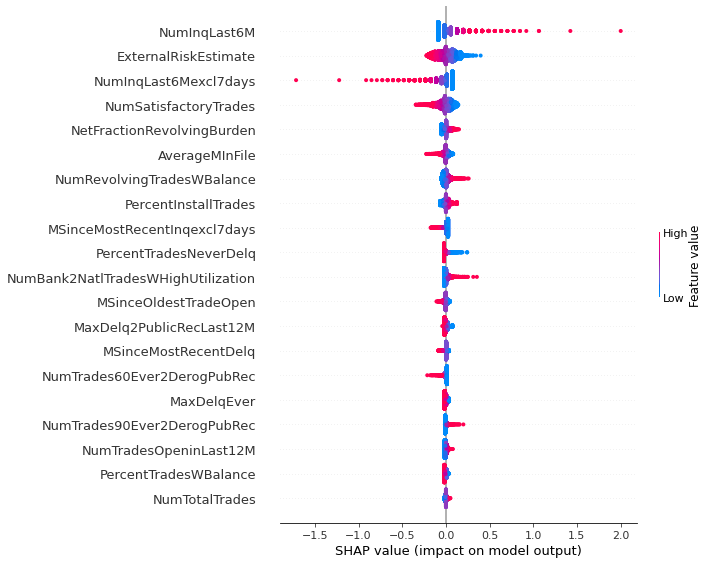

In [17]:
explainer = shap.LinearExplainer(lr_model, X_test) 
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

# DECISION TREE

In [45]:
# fit model
new_list = []

for k in range(10,23):
    dt_model = DecisionTreeClassifier(max_leaf_nodes = k, random_state=0, criterion='entropy')
    fit=dt_model.fit(X_train, y_train)
    dt_pred = dt_model.predict(X_test)
    new_list.append(accuracy_score(y_test,dt_pred))

In [46]:
new_list = []

for k in range(10,23):
    dt_model = DecisionTreeClassifier(max_leaf_nodes = k, random_state=0, criterion='entropy')
    fit=dt_model.fit(X_train, y_train)
    dt_pred_dummy = dt_model.predict(X_dummy)
    new_list.append(accuracy_score(y_dummy,dt_pred_dummy))

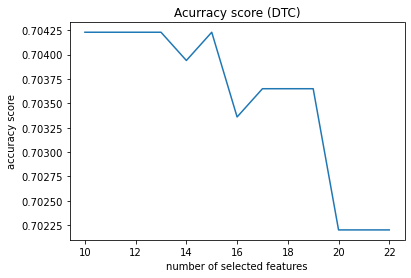

In [19]:
plt.plot(list(range(10,23)), new_list)
plt.title("Acurracy score (DTC)")
plt.xlabel('number of selected features')
plt.ylabel('accuracy score')
plt.show()

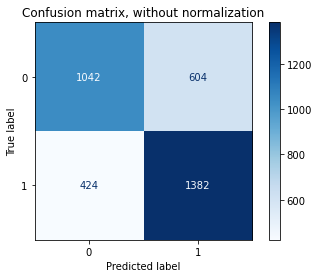

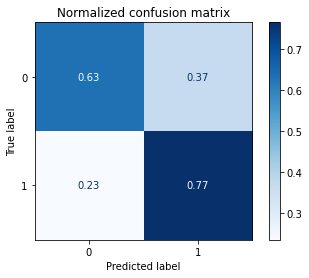

In [20]:
# confusion matrix
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(dt_model, X_test, y_test,
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
    disp.ax_.set_title(title)
plt.show()


In [21]:
# classification report
print(classification_report(y_test,dt_pred))

              precision    recall  f1-score   support

           0       0.71      0.63      0.67      1646
           1       0.70      0.77      0.73      1806

    accuracy                           0.70      3452
   macro avg       0.70      0.70      0.70      3452
weighted avg       0.70      0.70      0.70      3452



# SHAP

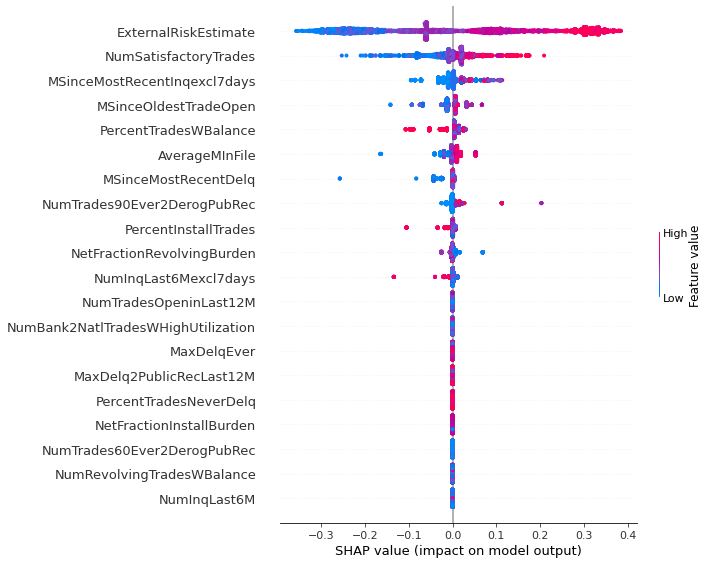

In [22]:
# explian global model using TreeExplainer
explainer = shap.TreeExplainer(dt_model)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values[0], X_test)

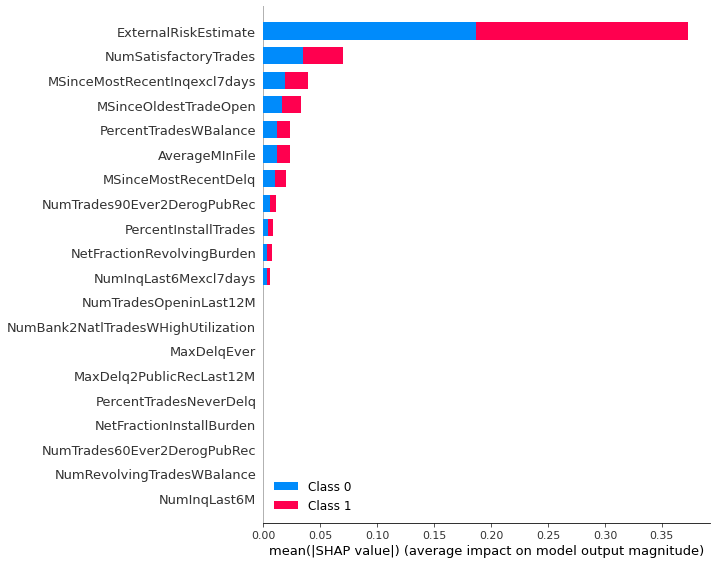

In [23]:
shap.summary_plot(shap_values, X_test, plot_type='bar')

# LIME

In [61]:
# Explain on dummy dataset
new_list = []
for k in range(10,23):
    dt_model = DecisionTreeClassifier(max_leaf_nodes = k, random_state=0, criterion='entropy')
    fit=dt_model.fit(X_dummy, y_dummy)
    dt_pred_dummy = dt_model.predict(X_dummy)
    new_list.append(accuracy_score(y_dummy,dt_pred_dummy))

In [78]:
# Explain individual prediction using LimeTabularExplainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_dummy.values, 
                                                   feature_names=X_train.columns, 
                                                   verbose=True, 
                                                   class_names=['Approved', 'Denied'],
                                                   mode='classification')

In [79]:
# storing a new observation
# i = random.randint(0, len(X_test))
# X_observation = X_test.iloc[i, :]


# For example, LIME explain the prediction on 1st observation of dummy 
X_observation = X_dummy.iloc[0]        # This is for front-end to change the observation 
explanation = explainer.explain_instance(X_observation.values, dt_model.predict_proba)
explanation.show_in_notebook()

Intercept 0.5594523205328679
Prediction_local [0.34680792]
Right: 1.0


In [50]:
# Create a test dataframe
test = y_dummy.to_frame()
test['predict'] = dt_pred_dummy
test.rename(columns={"RiskPerformance":"actual"}, inplace=True)
test.sample(5)


,actual,predict
8384,1,1
8166,1,1
9,1,1
7957,0,0
4359,0,0


In [26]:
# visulaise bad observations based on prediction
bad = test[test['predict']== 1].index
bad_index =np.random.choice(bad)

print('Predict:',test.loc[bad_index, "predict"])
print("Actual:", test.loc[bad_index, 'actual'])

exp = explainer.explain_instance(X_test.loc[bad_index], dt_model.predict_proba, num_features=23)
exp.show_in_notebook(show_table=True)


Predict: 1
Actual: 1
Intercept 0.45319996325960626
Prediction_local [0.74439198]
Right: 0.6321428571428571


In [28]:
# predict Deny while actual Approve
wrong_predit = []
for i in test.index:
  if test.loc[i, 'predict'] == 1 :
    if test.loc[i, 'actual'] == 0:
      wrong_predit.append(i)

bad_index =np.random.choice(wrong_predit)
print('Predict:',test.loc[bad_index, "predict"])
print("Actual:" , test.loc[bad_index, 'actual'])
exp = explainer.explain_instance(X_test.loc[bad_index],  dt_model.predict_proba, num_features=23)
exp.show_in_notebook(show_table=True)

Predict: 1
Actual: 0
Intercept 0.5321941692485563
Prediction_local [0.49996361]
Right: 0.9


In [29]:
# visulaise good observations based on prediction
good = test[test['predict']== 0].index
good_index =np.random.choice(good)

print('Predict:',test.loc[good_index, "predict"])
print("Actual:", test.loc[good_index, "actual"])

exp = explainer.explain_instance(X_test.loc[good_index], dt_model.predict_proba, num_features=10)
exp.show_in_notebook(show_table=True)

Predict: 0
Actual: 0
Intercept 0.5671648588543899
Prediction_local [0.43148521]
Right: 0.35658914728682173


In [30]:
# predict Approve while actual Deny
wrong_predit = []
for i in test.index:
  if test.loc[i, 'predict'] == 0 :
    if test.loc[i, 'actual'] == 1:
      wrong_predit.append(i)

good_index =np.random.choice(wrong_predit)
print('Predict:',test.loc[good_index, "predict"])
print("Actual:" , test.loc[good_index, 'actual'])
exp = explainer.explain_instance(X_test.loc[good_index],  dt_model.predict_proba, num_features=23)
exp.show_in_notebook(show_table=True)

Predict: 0
Actual: 1
Intercept 0.5524457555304417
Prediction_local [0.42683397]
Right: 0.35658914728682173


# Supported Vector Machine 

In [21]:
# fit model
svc = SVC(kernel='rbf', probability=True)
svc_model= svc.fit(X_train, y_train)
svc_pred = svc.predict(X_test)
print("Accuracy score:", accuracy_score(y_test, svc_pred))

Accuracy score: 0.7236574746008708


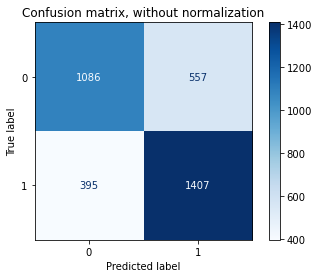

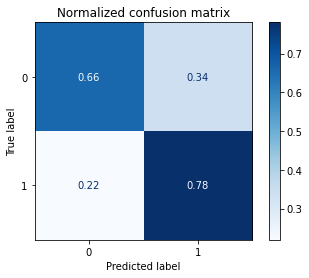

In [22]:
# confusion matrix
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(svc_model, X_test, y_test,
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
    disp.ax_.set_title(title)
plt.show()

In [23]:
# classification report
print(classification_report(y_test,svc_pred))

              precision    recall  f1-score   support

           0       0.73      0.66      0.70      1643
           1       0.72      0.78      0.75      1802

    accuracy                           0.72      3445
   macro avg       0.72      0.72      0.72      3445
weighted avg       0.72      0.72      0.72      3445



# SHAP

In [34]:
# Explain global model using KernelExplainer
explainer_all = shap.KernelExplainer(model=svc.predict_proba, data=X_train, link="logit")

Using 7007 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


If we use KernelExplainer to run the whole data sample as above, it will take very long time to generate shap_values. Instead, we will use shap.sample(data,K) as suggestion to accelerate its evaluation. Here, we choose K=50. 

In [35]:
explainer = shap.KernelExplainer(model=svc.predict_proba,data=shap.sample(X_train,50))

In [36]:
# Be patient! This'll take a while to run. We can modify the number of test sample the bigger sample the longer it takes. 
shap_values = explainer.shap_values(X_test[:5], approximate=True)

  0%|          | 0/5 [00:00<?, ?it/s]

In [105]:
shap.summary_plot(shap_values, X_test)

NameError: name 'shap_values' is not defined

This bar graph shows the feature names and their corresponding mean SHAP value.

# LIME

In [24]:
# Explain individual prediction using LimeTabularExplainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_dummy.values, 
                                                   feature_names=predictor.columns, 
                                                   verbose=True, 
                                                   class_names=['Approve', 'Deny'],
                                                   mode='classification')

In [25]:
# Create a test dataframe which consists of actual label and predicted label
test = y_test.to_frame()
test['predict'] = svc_pred
test.rename(columns={"RiskPerformance":"actual"}, inplace=True)
test.sample(5)

,actual,predict
6053,0,1
5178,1,1
3480,0,0
4566,1,1
2443,1,1


In [26]:
# Visualise bad observations based on prediction
bad = test[test['predict']== 1].index
bad_index =np.random.choice(bad)

print("Predict:",test.loc[bad_index, "predict"])
print("Actual:", test.loc[bad_index, "actual"])

exp = explainer.explain_instance(X_test.loc[bad_index], svc_model.predict_proba, num_features=10)
exp.show_in_notebook(show_table=True)

Predict: 1
Actual: 1
Intercept 0.28941387229030335
Prediction_local [0.83428334]
Right: 0.8175114116562219


In [41]:
# Visualise good observations based on prediction
good = test[test['predict']== 0].index
good_index =np.random.choice(good)

print("Predict:",test.loc[good_index, "predict"])
print("Actual:", test.loc[good_index, "actual"])

exp = explainer.explain_instance(X_test.loc[good_index], svc_model.predict_proba, num_features=10)
exp.show_in_notebook(show_table=True)

Predict: 0
Actual: 0
Intercept 0.7284360332500841
Prediction_local [0.11451683]
Right: 0.11505026963157855


In [44]:
# predict Deny while it actual Approve
wrong_predit = []
for i in test.index:
  if test.loc[i, 'predict'] == 1 :
    if test.loc[i, 'actual'] == 0:
      wrong_predit.append(i)

bad_index =np.random.choice(wrong_predit)
print('Predict:',test.loc[bad_index, "predict"])
print("Actual:" , test.loc[bad_index, 'actual'])
exp = explainer.explain_instance(X_test.loc[bad_index],  svc_model.predict_proba, num_features=23)
exp.show_in_notebook(show_table=True)

Predict: 1
Actual: 0
Intercept 0.5522885467218803
Prediction_local [0.53016651]
Right: 0.5202397448194741


In [43]:
# predict Approve while it actual Deny
wrong_predit = []
for i in test.index:
  if test.loc[i, 'predict'] == 0 :
    if test.loc[i, 'actual'] == 1:
      wrong_predit.append(i)

good_index =np.random.choice(wrong_predit)
print('Predict:',test.loc[good_index, "predict"])
print("Actual:" , test.loc[good_index, 'actual'])
exp = explainer.explain_instance(X_test.loc[good_index],  svc_model.predict_proba, num_features=23)
exp.show_in_notebook(show_table=True)

Predict: 0
Actual: 1
Intercept 0.5950051402431453
Prediction_local [0.47316308]
Right: 0.34848798351576127


# predict and explain  on dummy dataset

In [81]:
# fit model
svc = SVC(kernel='rbf', probability=True)
svc_model= svc.fit(X_dummy, y_dummy)
svc_pred = svc.predict(X_test)
print("Accuracy score:", accuracy_score(y_test, svc_pred))

Accuracy score: 0.5230769230769231


In [82]:
# Explain individual prediction using LimeTabularExplainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_dummy.values, 
                                                   feature_names=X_train.columns, 
                                                   verbose=True, 
                                                   class_names=['Approved', 'Denied'],
                                                   mode='classification')

In [103]:
# storing a new observation
# i = random.randint(0, len(X_test))
# X_observation = X_test.iloc[i, :]


# For example, LIME explain the prediction on ... observation of the dummy dataset
X_observation = X_dummy.iloc[2]        
explanation = explainer.explain_instance(X_observation.values, svc_model.predict_proba)
explanation.show_in_notebook()

Intercept 0.4512150818774053
Prediction_local [0.49097086]
Right: 0.4296187302022868
